## Importation des bibliothéques

In [68]:
import tensorflow as tf
from tensorflow import keras
import tensorflow.keras.backend as K
from tensorflow.keras.layers import Convolution2D,BatchNormalization,ReLU,LeakyReLU,Add,Activation
from tensorflow.keras.layers import GlobalAveragePooling2D,AveragePooling2D,UpSampling2D
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.utils.vis_utils import plot_model
import numpy as np 
import pandas as pd 
import os
#import visualkeras
import matplotlib.pyplot as plt

from tqdm import tqdm
import random
import glob
import cv2
from skimage import io
from skimage.transform import resize
from sklearn.model_selection import train_test_split

In [37]:
data_map = []
for sub_dir_path in glob.glob("/kaggle/input/lgg-mri-segmentation/kaggle_3m/"+"*"):
    #if os.path.isdir(sub_path_dir):
    try:
        dir_name = sub_dir_path.split('/')[-1]
        for filename in os.listdir(sub_dir_path):
            image_path = sub_dir_path + '/' + filename
            data_map.extend([dir_name, image_path])
    except Exception as e:
        print(e)

[Errno 20] Not a directory: '/kaggle/input/lgg-mri-segmentation/kaggle_3m/README.md'
[Errno 20] Not a directory: '/kaggle/input/lgg-mri-segmentation/kaggle_3m/data.csv'


In [38]:
df = pd.DataFrame({"patient_id" : data_map[::2],
                   "path" : data_map[1::2]})
df.head()

,patient_id,path
0,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
1,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
2,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
3,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
4,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...


In [39]:
df.path[0]

'/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45.tif'

In [40]:
len('/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45_mask.tif')

100

In [41]:
df_imgs = df[~df['path'].str.contains("mask")]
df_masks = df[df['path'].str.contains("mask")]

# File path line length images for later sorting
BASE_LEN = len("/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_6404_19850629/TCGA_DU_6404_19850629_") #89
END_IMG_LEN = 4 #len('/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45') #91
END_MASK_LEN = 9 #len('/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45_mask.tif') #100

# Data sorting
imgs = sorted(df_imgs["path"].values, key=lambda x : int(x[BASE_LEN:-END_IMG_LEN]))
masks = sorted(df_masks["path"].values, key=lambda x : int(x[BASE_LEN:-END_MASK_LEN]))

# Sorting check
idx = random.randint(0, len(imgs)-1)
print("Path to the Image:", imgs[idx], "\nPath to the Mask:", masks[idx])

Path to the Image: /kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7694_19950404/TCGA_HT_7694_19950404_21.tif 
Path to the Mask: /kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7694_19950404/TCGA_HT_7694_19950404_21_mask.tif


In [42]:
# Final dataframe
brain_df = pd.DataFrame({"patient_id": df_imgs.patient_id.values,
                         "image_path": imgs,
                         "mask_path": masks
                        })
def pos_neg_diagnosis(mask_path):
    value = np.max(cv2.imread(mask_path))
    if value > 0 : 
        return 1
    else:
        return 0
    
brain_df['mask'] = brain_df['mask_path'].apply(lambda x: pos_neg_diagnosis(x))
brain_df

,patient_id,image_path,mask_path,mask
0,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,0
1,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,0
2,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,0
3,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,0
4,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,0
...,...,...,...,...
3924,TCGA_DU_7306_19930512,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,0
3925,TCGA_DU_7306_19930512,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,0
3926,TCGA_DU_7306_19930512,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,0
3927,TCGA_DU_7306_19930512,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,0


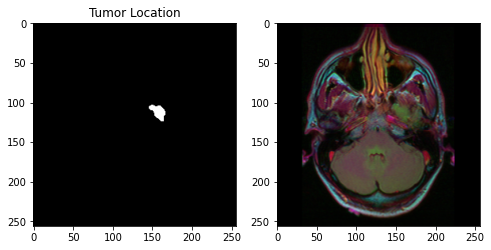

In [43]:
for i in range(len(brain_df)):
    if cv2.imread(brain_df.mask_path[i]).max() > 0:
        break

plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.imshow(cv2.imread(brain_df.mask_path[i]))
plt.title('Tumor Location')

plt.subplot(1,2,2)
plt.imshow(cv2.imread(brain_df.image_path[i]))

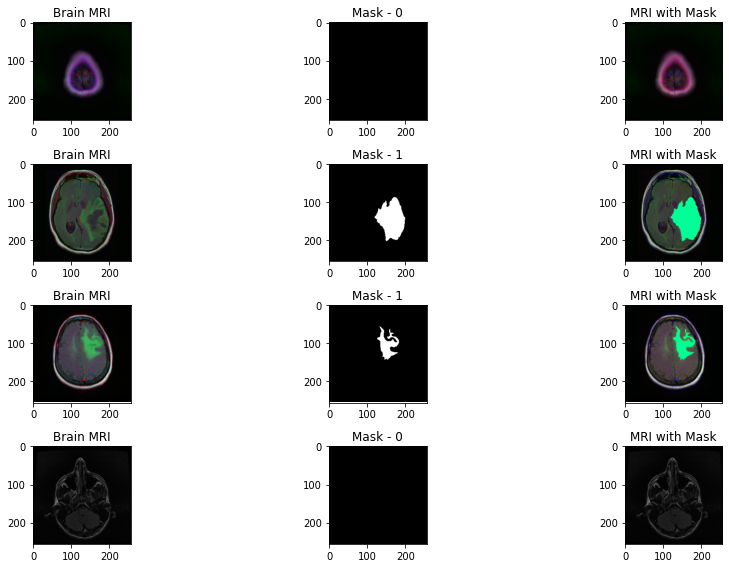

In [44]:
fig, axs = plt.subplots(4,3, figsize=(14,8))
count = 0
for x in range(4):
    i = 0
    while(True):
        i = random.randint(0, len(brain_df)) # select a random index
        if(brain_df['mask'][i] == 0): count+=1
        if(count > 2 and brain_df['mask'][i] == 0): continue
        break
        
    img = io.imread(brain_df.image_path[i])
    mask = io.imread(brain_df.mask_path[i])
    axs[x][0].title.set_text("Brain MRI") # set title
    axs[x][0].imshow(cv2.imread(brain_df.image_path[i])) # show MRI 
    axs[x][1].title.set_text("Mask - " + str(brain_df['mask'][i])) # plot title on the mask (0 or 1)
    axs[x][1].imshow(cv2.imread(brain_df.mask_path[i])) # Show corresponding mask    
    img[mask==255] = (0,255,150)  # change pixel color at the position of mask
    axs[x][2].title.set_text("MRI with Mask")
    axs[x][2].imshow(img)
    
    
fig.tight_layout()

In [45]:
print(img.shape)
print(mask.shape)

(256, 256, 3)
(256, 256)


In [46]:
brain_df_mask = brain_df[brain_df['mask'] == 1]
brain_df_mask.shape

(1373, 4)

## Le pré-traitement des données

In [47]:
# creating test, train and val sets
X_train, X_test = train_test_split(brain_df_mask, test_size=0.15, random_state=42)
print("Train size is {} & test size is {}".format(len(X_train), len(X_test)))

train_ids = list(X_train.image_path)
train_mask = list(X_train.mask_path)

test_ids = list(X_test.image_path)
test_mask= list(X_test.mask_path)

Train size is 1167 & test size is 206


In [48]:
# Params
IMG_WIDTH = 256
IMG_HEIGHT = 256
IMG_CHANNELS = 3

In [49]:
X_train = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
y_train = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool)

In [50]:
X_test = np.zeros((len(test_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
y_test = np.zeros((len(test_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool)

In [51]:
#Train
for n, id_ in tqdm(enumerate(train_ids), total=len(train_ids)):
    img = io.imread(id_)[:,:,:IMG_CHANNELS]
    #img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    X_train[n] = img
    mask = io.imread(train_mask[n])
    mask = np.expand_dims(resize(
                mask, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True),
                              axis=-1)
    y_train[n] = mask

100%|██████████| 1167/1167 [00:11<00:00, 97.46it/s] 


In [52]:
#Test
for n, id_ in tqdm(enumerate(test_ids), total=len(test_ids)):
    img = io.imread(id_)[:,:,:IMG_CHANNELS]
    #img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    X_test[n] = img
    mask = io.imread(test_mask[n])
    mask = np.expand_dims(resize(
                mask, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True),
                              axis=-1)
    y_test[n] = mask

100%|██████████| 206/206 [00:02<00:00, 97.08it/s]


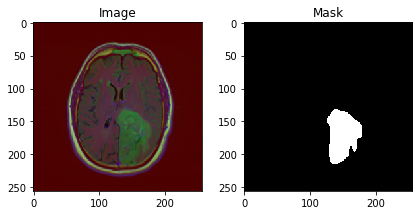

In [53]:
i = 15
plt.subplot(121)
io.imshow(X_train[i])
plt.title('Image')
plt.subplot(122)
io.imshow(np.squeeze(y_train[i]))
plt.title('Mask')
plt.show()

In [54]:
y_train[i].shape

(256, 256, 1)

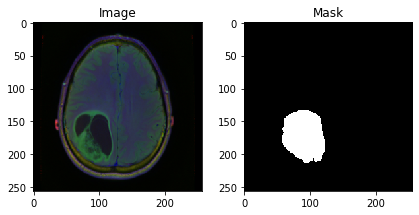

In [55]:
i = 5
plt.subplot(121)
io.imshow(X_test[i])
plt.title('Image')
plt.subplot(122)
io.imshow(np.squeeze(y_test[i]))
plt.title('Mask')
plt.show()

## Le modèle PSPNet

In [69]:
def conv_block(X,filters,block):
    # resiudal block with dilated convolutions
    # add skip connection at last after doing convoluion operation to input X
    
    b = 'block_'+str(block)+'_'
    f1,f2,f3 = filters
    X_skip = X
    # block_a
    X = Convolution2D(filters=f1,kernel_size=(1,1),dilation_rate=(1,1),
                      padding='same',kernel_initializer='he_normal',name=b+'a')(X)
    X = BatchNormalization(name=b+'batch_norm_a')(X)
    X = LeakyReLU(alpha=0.2,name=b+'leakyrelu_a')(X)
    # block_b
    X = Convolution2D(filters=f2,kernel_size=(3,3),dilation_rate=(2,2),
                      padding='same',kernel_initializer='he_normal',name=b+'b')(X)
    X = BatchNormalization(name=b+'batch_norm_b')(X)
    X = LeakyReLU(alpha=0.2,name=b+'leakyrelu_b')(X)
    # block_c
    X = Convolution2D(filters=f3,kernel_size=(1,1),dilation_rate=(1,1),
                      padding='same',kernel_initializer='he_normal',name=b+'c')(X)
    X = BatchNormalization(name=b+'batch_norm_c')(X)
    # skip_conv
    X_skip = Convolution2D(filters=f3,kernel_size=(3,3),padding='same',name=b+'skip_conv')(X_skip)
    X_skip = BatchNormalization(name=b+'batch_norm_skip_conv')(X_skip)
    # block_c + skip_conv
    X = Add(name=b+'add')([X,X_skip])
    X = ReLU(name=b+'relu')(X)
    return X
    
def base_feature_maps(input_layer):
    # base covolution module to get input image feature maps 
    
    # block_1
    base = conv_block(input_layer,[32,32,64],'1')
    # block_2
    base = conv_block(base,[64,64,128],'2')
    # block_3
    base = conv_block(base,[128,128,256],'3')
    return base

def pyramid_feature_maps(input_layer):
    # pyramid pooling module
    
    base = base_feature_maps(input_layer)
    # red
    red = GlobalAveragePooling2D(name='red_pool')(base)
    red = tf.keras.layers.Reshape((1,1,256))(red)
    red = Convolution2D(filters=64,kernel_size=(1,1),name='red_1_by_1')(red)
    red = UpSampling2D(size=256,interpolation='bilinear',name='red_upsampling')(red)
    # yellow
    yellow = AveragePooling2D(pool_size=(2,2),name='yellow_pool')(base)
    yellow = Convolution2D(filters=64,kernel_size=(1,1),name='yellow_1_by_1')(yellow)
    yellow = UpSampling2D(size=2,interpolation='bilinear',name='yellow_upsampling')(yellow)
    # blue
    blue = AveragePooling2D(pool_size=(4,4),name='blue_pool')(base)
    blue = Convolution2D(filters=64,kernel_size=(1,1),name='blue_1_by_1')(blue)
    blue = UpSampling2D(size=4,interpolation='bilinear',name='blue_upsampling')(blue)
    # green
    green = AveragePooling2D(pool_size=(8,8),name='green_pool')(base)
    green = Convolution2D(filters=64,kernel_size=(1,1),name='green_1_by_1')(green)
    green = UpSampling2D(size=8,interpolation='bilinear',name='green_upsampling')(green)
    # base + red + yellow + blue + green
    return tf.keras.layers.concatenate([base,red,yellow,blue,green])

def last_conv_module(input_layer):
    X = pyramid_feature_maps(input_layer)
    X = Convolution2D(filters=1,kernel_size=1,padding='same',name='last_conv_3_by_3')(X)
    #X = BatchNormalization(name='last_conv_3_by_3_batch_norm')(X)
    X = Activation('sigmoid',name='last_conv_sigmoid')(X)
    #X = tf.keras.layers.Flatten(name='last_conv_flatten')(X)
    return X

In [70]:
input_layer = tf.keras.Input(shape=(256, 256, 3),name='input')
output_layer = last_conv_module(input_layer)
model = tf.keras.Model(inputs=input_layer,outputs=output_layer)

In [71]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
block_1_a (Conv2D)              (None, 256, 256, 32) 128         input[0][0]                      
__________________________________________________________________________________________________
block_1_batch_norm_a (BatchNorm (None, 256, 256, 32) 128         block_1_a[0][0]                  
__________________________________________________________________________________________________
block_1_leakyrelu_a (LeakyReLU) (None, 256, 256, 32) 0           block_1_batch_norm_a[0][0]       
____________________________________________________________________________________________

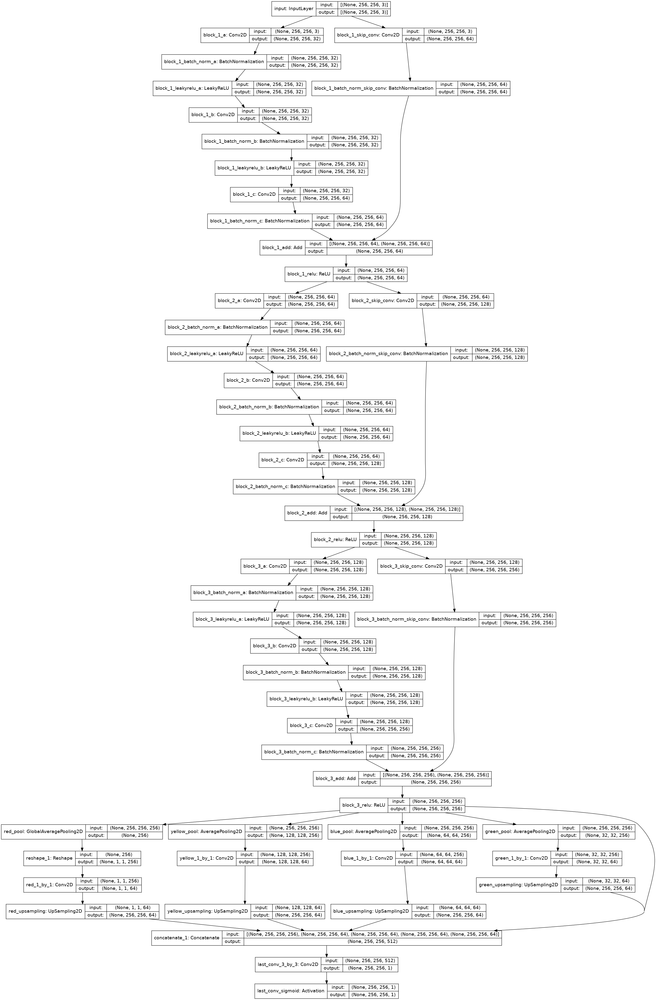

In [59]:
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

## Les métrics de performance

In [60]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import backend as K

def iou(y_true, y_pred):
    def f(y_true, y_pred):
        intersection = (y_true * y_pred).sum()
        union = y_true.sum() + y_pred.sum() - intersection
        x = (intersection + 1e-15) / (union + 1e-15)
        x = x.astype(np.float32)
        return x
    return tf.numpy_function(f, [y_true, y_pred], tf.float32)

smooth = 1e-15
def dice_coef(y_true, y_pred):
    y_true = tf.keras.layers.Flatten()(y_true)
    y_pred = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)
def dice_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

In [74]:
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, ReduceLROnPlateau, EarlyStopping, TensorBoard
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Recall, Precision

In [77]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
              loss=dice_loss,
              metrics=[dice_coef, iou, Recall(), Precision()])

In [63]:

from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

checkpointer = ModelCheckpoint(filepath="PSP_Model-weights-6.hdf5", 
                               verbose=1, 
                               save_best_only=True,
                               save_weights_only=True
                              )
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=5,
                              min_delta=0.0001,
                              factor=0.2
                             )

#callbacks = [ReduceLROnPlateau(factor=0.1, min_lr=1e-5, verbose=1),ModelCheckpoint('PSP_Model-weights-6.hdf5', verbose=1, save_best_only=True, save_weights_only=True]

In [64]:
tf.config.run_functions_eagerly(True)

## L'entrainement du modèle

In [65]:
model_history = model.fit(X_train, y_train.astype(np.float32), validation_split=0.1, batch_size=4, 
                          epochs=100, callbacks=[checkpointer,reduce_lr])

/opt/conda/lib/python3.7/site-packages/tensorflow/python/data/ops/dataset_ops.py:3504: UserWarning: Even though the tf.config.experimental_run_functions_eagerly option is set, this option does not apply to tf.data functions. tf.data functions are still traced and executed as graphs.
  "Even though the tf.config.experimental_run_functions_eagerly "


Epoch 1/100
263/263 [==============================] - 156s 593ms/step - loss: 0.7510 - dice_coef: 0.2490 - iou: 0.1595 - recall_1: 0.7748 - precision_1: 0.1289 - val_loss: 0.4182 - val_dice_coef: 0.5673 - val_iou: 0.4123 - val_recall_1: 0.6560 - val_precision_1: 0.6380

Epoch 00001: val_loss improved from inf to 0.41823, saving model to PSP_Model-weights-6.hdf5
Epoch 2/100
263/263 [==============================] - 155s 591ms/step - loss: 0.3935 - dice_coef: 0.6065 - iou: 0.4566 - recall_1: 0.5983 - precision_1: 0.7224 - val_loss: 0.3713 - val_dice_coef: 0.6130 - val_iou: 0.4604 - val_recall_1: 0.6509 - val_precision_1: 0.6746

Epoch 00002: val_loss improved from 0.41823 to 0.37132, saving model to PSP_Model-weights-6.hdf5
Epoch 3/100
263/263 [==============================] - 155s 590ms/step - loss: 0.3529 - dice_coef: 0.6471 - iou: 0.4965 - recall_1: 0.6282 - precision_1: 0.7461 - val_loss: 0.3613 - val_dice_coef: 0.6227 - val_iou: 0.4709 - val_recall_1: 0.6403 - val_precision_1: 0.

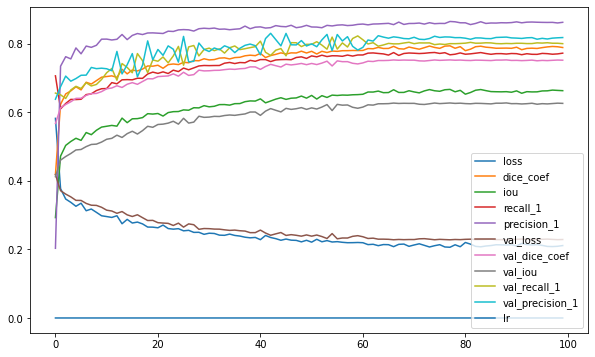

In [66]:
plt.figure(figsize=[10,6])
for key in model_history.history.keys():
    plt.plot(model_history.history[key], label=key)
    
plt.legend()
plt.show()

## L'évaluation du modèle

In [78]:
model.load_weights("/kaggle/input/pspnet/PSP_Model-weights-6.hdf5")
print("Evaluate on val data")
results = model.evaluate(X_test, y_test.astype(np.float32), batch_size=4)

Evaluate on val data
52/52 [==============================] - 10s 181ms/step - loss: 0.2268 - dice_coef: 0.7732 - iou: 0.6393 - recall_2: 0.7954 - precision_2: 0.8086


In [80]:
print("Dice Loss:", results[0])
print("Iou Coeff:", results[1])
print("Dice Coeff:", results[2])
print("Recall:", results[3])
print("Precision :", results[4])

Dice Loss: 0.23147226870059967
Iou Coeff: 0.7668638825416565
Dice Coeff: 0.6327930688858032
Recall: 0.7888135313987732
Precision : 0.8020846843719482


In [81]:
preds = model.predict(X_test, verbose=1)

7/7 [==============================] - 18s 2s/step


In [82]:
# Thresholding
preds_t = (preds > 0.5).astype(np.uint8)

In [83]:
def show_images(i, ti, orgimg, y_true, preds, preds_t):
    plt.figure(figsize=(8,8))
    plt.subplot(221)
    io.imshow(orgimg[i])
    plt.title('Image to be Segmented')
    plt.subplot(222)
    io.imshow(y_test[ti])
    plt.title('Segmentation Ground Truth')
    plt.subplot(223)
    io.imshow(preds[ti])    
    plt.title('Predicted Segmentation')
    plt.subplot(224)
    io.imshow(preds_t[ti])
    plt.title('Thresholded Segmentation')
    plt.show()

In [84]:
len(X_test)

206

/opt/conda/lib/python3.7/site-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


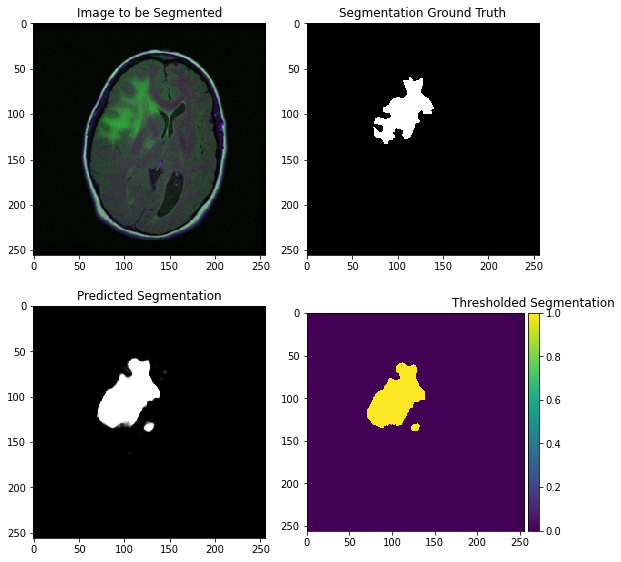

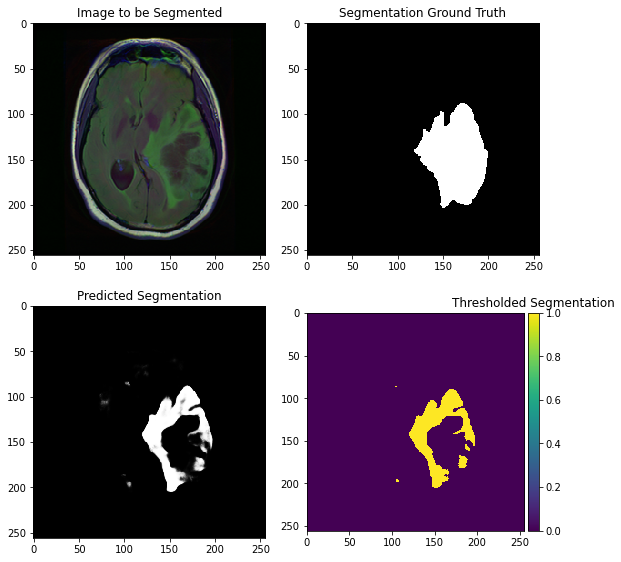

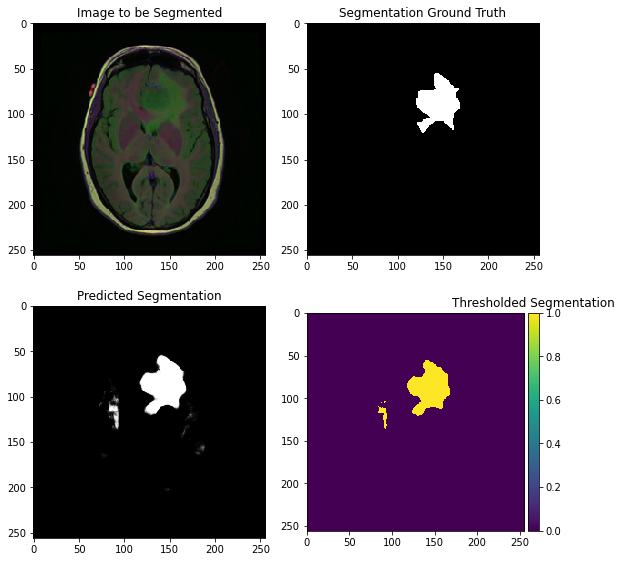

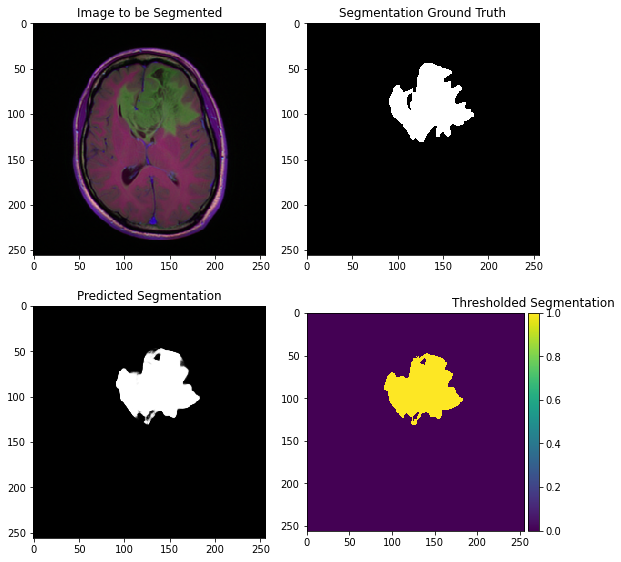

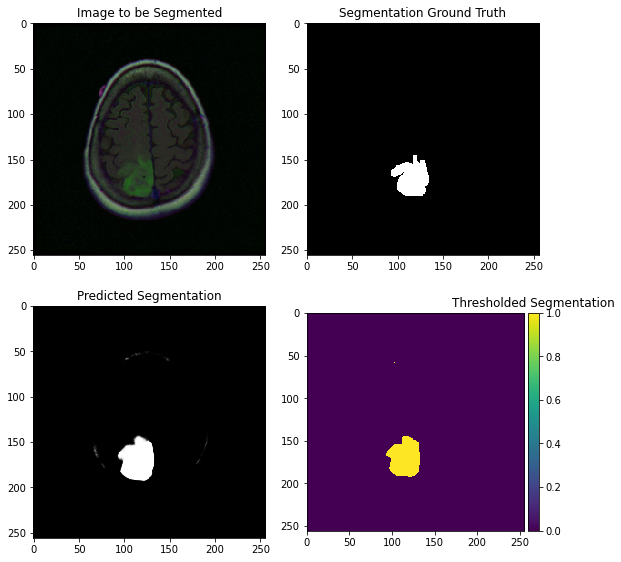

...

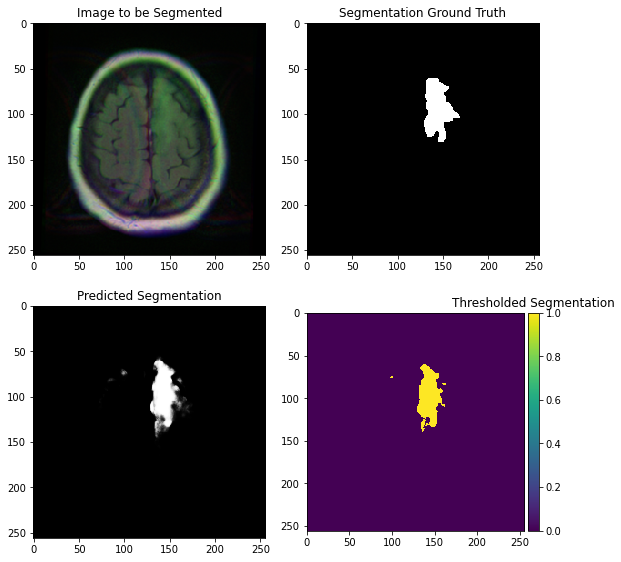

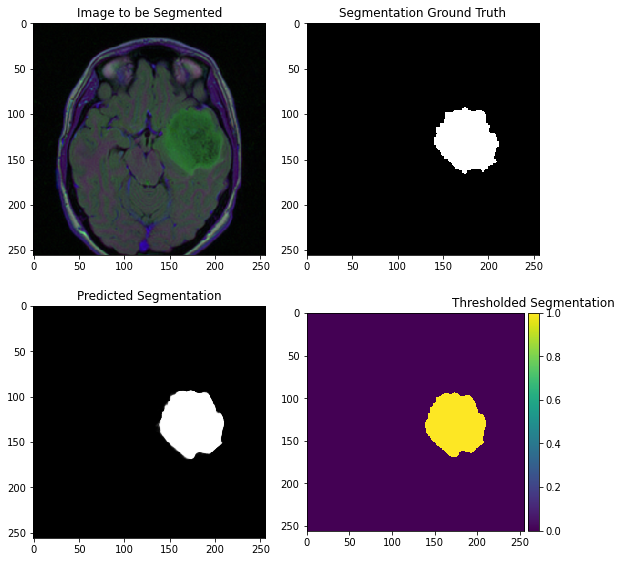

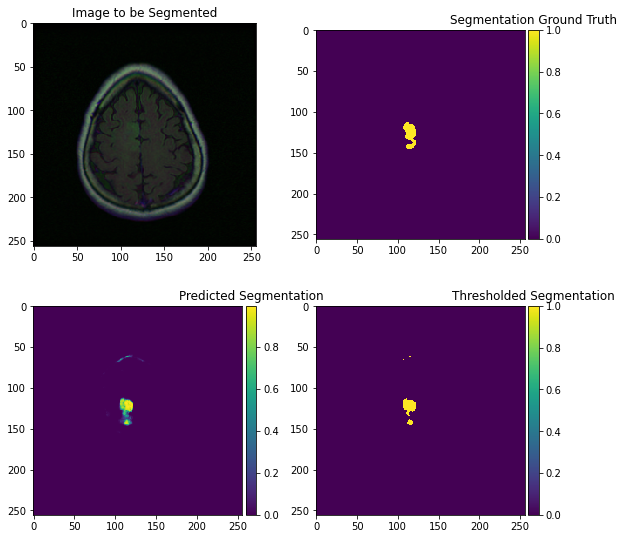

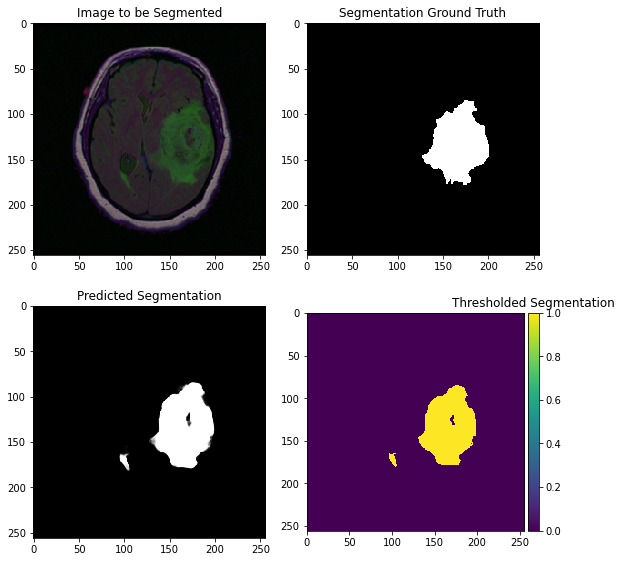

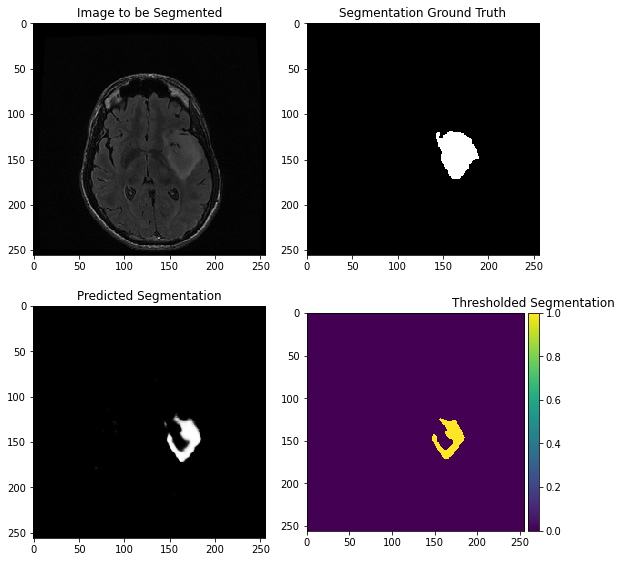

In [ ]:
for i in range(100,200):
    show_images(i, i, X_test, y_test, preds, preds_t)

In [ ]:
print(np.amax(preds[i]))
print(np.amax(preds_t[i]))

print(np.amin(preds[i]))
print(np.amin(preds_t[i]))

In [ ]:
preds[i]

In [ ]:
preds_t[i][:,:,0]

In [ ]:
plt.imshow(preds_t[i][:,:,0], interpolation='nearest')